# Tutorial 3: Denoising of FlatST

## Import the necessary modules

In [56]:
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import STAGATE_pyG
import FlatST
from sklearn.metrics.cluster import adjusted_rand_score
os.environ['R_HOME'] = '/mnt/mydisk/home/chenxd/.conda/envs/r_env/lib/R'

## Data preprocessing

In [57]:
adata = sc.read_h5ad('/mnt/mydisk/home/chenxd/论文复现/data/151673.h5ad')
adata.var_names_make_unique()
adata = adata[~adata.obs.isna().any(axis=1)].copy()
adata

AnnData object with n_obs × n_vars = 3611 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'Region'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [58]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata = adata[:,adata.var['total_counts']>100]

In [59]:
#Normalization
# sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=3000)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/mnt/mydisk/home/chenxd/.conda/envs/stagate/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:216: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/tmp/ipykernel_702972/261719250.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["Region"])


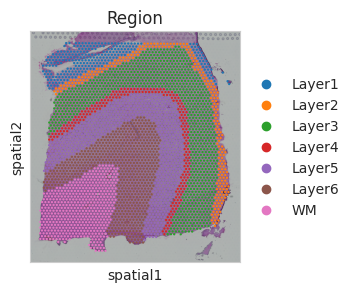

In [60]:
plt.rcParams["figure.figsize"] = (3, 3)
sc.pl.spatial(adata, img_key="hires", color=["Region"])

## Denoising

In [63]:
FlatST.Cal_Spatial_Net(adata, rad_cutoff=300)
adata = FlatST.train_FlatST(adata,hidden_dims=[610,12],cuda_device=0,num_smooth_iterations=3,keep_percent=0.97,n_epochs=1300,save_reconstrction=True)
adata = FlatST.mclust_R(adata, used_obsm='FlatST', num_cluster=7)
adjusted_rand_score(adata.obs['mclust'], adata.obs['Region'])

------Calculating spatial graph...
'highly_variable' not in adata.var.columns!
The graph contains 62208 edges, 3611 cells.
17.2274 neighbors per cell on average.
'highly_variable' not in adata.var.columns!
Size of Input:  (3611, 11342)


 80%|███████▉  | 1038/1300 [00:26<00:06, 38.50it/s]


Early stopping at epoch 1039
fitting ...
  |======================================================================| 100%


0.39418789259807135

## Screen specific genes

/tmp/ipykernel_702972/1008634265.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0], title='RAW_'+plot_gene, vmax='p99',cmap='viridis')
/tmp/ipykernel_702972/1008634265.py:4: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1], title='FlatST_'+plot_gene, layer='STAGATE_ReX', vmax='2.5', cmap='viridis')


[<Axes: title={'center': 'FlatST_GFAP'}, xlabel='spatial1', ylabel='spatial2'>]

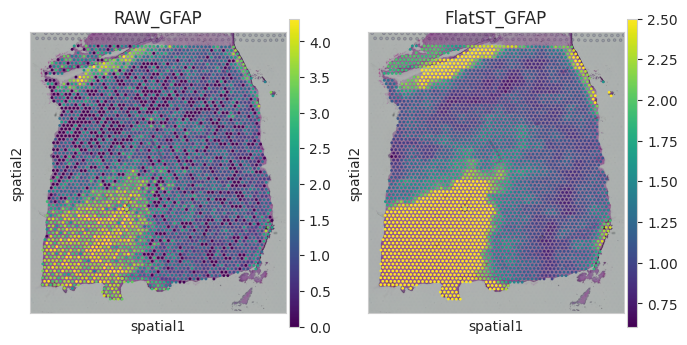

In [81]:
plot_gene = 'GFAP'
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[0], title='RAW_'+plot_gene, vmax='p99',cmap='viridis')
sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[1], title='FlatST_'+plot_gene, layer='STAGATE_ReX', vmax='2.5', cmap='viridis')

## Compare with STAGATE

/tmp/ipykernel_3136182/3596718948.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 0],
/tmp/ipykernel_3136182/3596718948.py:14: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 1],
/tmp/ipykernel_3136182/3596718948.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 2],
/tmp/ipykernel_3136182/3596718948.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 0],
/tmp/ipykernel_3136182/3596718948.py:14: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 1],
/tmp/ipykernel_3136182/3596718948.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instea

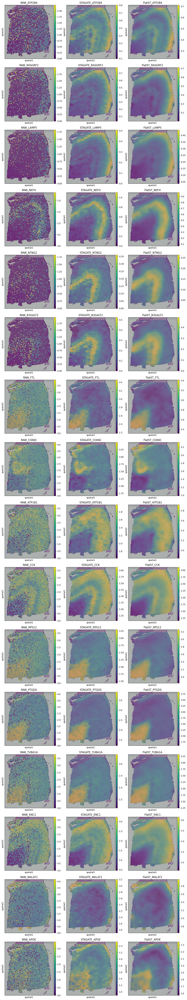

In [21]:
import scanpy as sc
import matplotlib.pyplot as plt

plot_genes = ['ATP2B4', 'RASGRF2', 'LAMP5', 'NEFH', 'NTNG2', 'B3GALT2',
              'FTL', 'COX6C', 'ATP1B1', 'CCK', 'RPS12', 'PTGDS',
              'TUBA1A', 'ENC1', 'MALAT1', 'APOE']

n = len(plot_genes)
fig, axs = plt.subplots(n, 3, figsize=(12, 4 * n))

for i, plot_gene in enumerate(plot_genes):
    sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 0],
                  title='RAW_' + plot_gene, vmax='p99', cmap='viridis')
    sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 1],
                  title='STAGATE_' + plot_gene, layer='STAGATE_ReX', vmax='p99', cmap='viridis')
    sc.pl.spatial(adata, img_key="hires", color=plot_gene, show=False, ax=axs[i, 2],
                  title='FlatST_' + plot_gene, layer='FlatST_ReX', vmax='p99', cmap='viridis')

plt.tight_layout()
plt.show()


## Draw the gene expression map

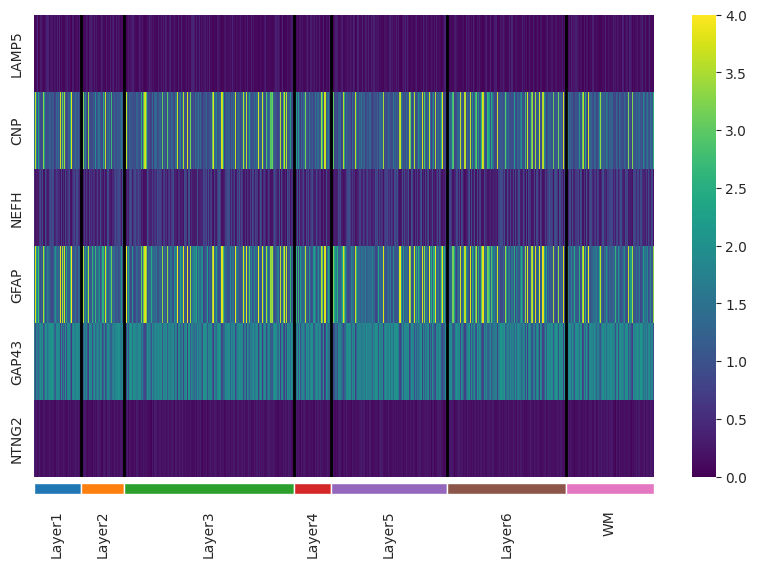

In [ ]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load data (example, replace with the actual data path)
# adata = anndata.read_h5ad("your_data.h5ad")

# Extract data
# gene_expression = adata.X
gene_expression = adata.layers['FlatST_ReX']
# gene_expression = adata.layers['STAGATE_ReX']
genes = adata.var_names
regions = adata.obs['Region']

# Sort the areas
regions = regions.sort_values()

# specific_genes = ['MALAT1', 'LAMP5', 'NEFH', 'B3GALT2', 'FTL', 'CCK']
# specific_genes = ['ATP2B4', 'RASGRF2', 'LAMP5', 'NEFH', 'NTNG2', 'B3GALT2',
#               'FTL', 'COX6C', 'ATP1B1', 'CCK', 'RPS12', 'PTGDS',
#               'TUBA1A', 'ENC1', 'MALAT1', 'APOE']
specific_genes = ['LAMP5','CNP',  'NEFH','GFAP', 'GAP43', 'NTNG2']
# specific_genes = ['LAMP5']
# Check whether each gene exists
found_genes = []
for gene in specific_genes:
    if gene in genes:
        found_genes.append(gene)
    else:
        print(f"Warning: Gene '{gene}' not found, skipping.")

if not found_genes:
    raise ValueError("No target genes found, please check gene names.")

# Get the indices of the found genes
gene_indices = [genes.get_loc(gene) for gene in found_genes]

# Filter the existing gene expression data
specific_gene_expression = gene_expression[:, gene_indices]

# Convert to a dense array (if it is a sparse matrix)
if hasattr(specific_gene_expression, 'toarray'):
    specific_gene_expression = specific_gene_expression.toarray()

# Create a DataFrame
df = pd.DataFrame(specific_gene_expression, columns=found_genes, index=regions)
df = df.T
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(10, 6))
sns.heatmap(df, cmap='viridis', ax=ax,vmin=0,vmax=4)

# Delete the X-axis label
ax.set_xlabel('')

# Get unique regions and the starting index for each region
unique_regions = df.columns.unique()
region_indices = []
current_index = 0
for region in unique_regions:
    region_size = (df.columns == region).sum()
    region_indices.append(current_index + region_size)
    current_index += region_size

# Only display the unique area name
ax.set_xticks([(start + end) // 2 for start, end in zip([0] + region_indices[:-1], region_indices)])
ax.set_xticklabels(unique_regions)

# Move the X-axis label down
ax.tick_params(axis='x', pad=20)

# Add thick black vertical lines between different areas
for index in region_indices[:-1]:
    ax.axvline(x=index, color='black', linewidth=2)

# Bar colors
bar_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

# Add a column of the same length as the area below the main image
bottom_bar_ax = fig.add_axes([ax.get_position().x0, ax.get_position().y0 - 0.03, ax.get_position().width, 0.02])

# Set the X-axis range to be consistent with the number of columns in the heat map
bottom_bar_ax.set_xlim(0, len(df.columns))

for i, (start, end) in enumerate(zip([0] + region_indices[:-1], region_indices)):
    color = bar_colors[i % len(bar_colors)]
    bottom_bar_ax.barh(y=0, width=end - start, left=start, color=color, height=1)

bottom_bar_ax.axis('off')

plt.show()